# Splitting a large playlist into cohesive sub-playlists

## Acquire data

In [1]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
import spotipy
from spotipy.oauth2 import SpotifyOAuth

In [2]:
scope = "playlist-modify-public playlist-modify-private"

spotify = spotipy.Spotify(auth_manager=SpotifyOAuth(scope=scope))
# spotify = spotipy.Spotify(client_credentials_manager=SpotifyClientCredentials())

In [3]:
playlist_id = "spotify:playlist:4AfSnWDVWMeA6NeNjJjYsS"

In [4]:
def get_all_tracks(playlist_id, fields=None, callback=None, check_len=True):
    if fields is not None:
        if 'total' not in fields:
            fields += ',total'
        if 'next' not in fields:
            fields += ',next'
    if callback is None:
        callback = lambda x: x
    tracks = []
    res = spotify.playlist_items(playlist_id, fields=fields)
    tracks.extend(callback(res['items']))
    while res['next']:
        res = spotify.next(res)
        tracks.extend(callback(res['items']))
    if check_len:
        assert len(tracks) == res['total']
    return tracks

In [5]:
def get_audio_features(tracks: list[dict]) -> list:
    keep = ('id', 'danceability', 'energy', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence')
    features = spotify.audio_features([t['track']['id'] for t in tracks])
    return [{k:v for k,v in f.items() if k in keep} for f in features]

In [6]:
pl_tracks = get_all_tracks(playlist_id, fields='items(track.id)', callback=get_audio_features)

In [7]:
track_df = pd.DataFrame(pl_tracks)
track_df.head()

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,id
0,0.230,0.931,0.0637,0.000214,0.018900,0.106,0.428,3zniSx8DVtUSuJ0WAToZUy
1,0.173,0.918,0.1100,0.048100,0.014000,0.114,0.194,3hGbVLrv1aUWdUg0AXXCZo
2,0.264,0.879,0.0519,0.000069,0.198000,0.433,0.255,432KmEGkAnemVwEWezyFFz
3,0.345,0.790,0.0841,0.002410,0.000006,0.114,0.444,7gRfcuBMi3CUSHOV8qL3wA
4,0.252,0.886,0.0714,0.000029,0.000005,0.256,0.498,5YHhxbtAAkOiIXqNBfYjZU


## Investigate the data

In [8]:
track_df.describe()

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence
count,1736.000000,1736.000000,1736.000000,1736.000000,1736.000000,1736.000000,1736.000000
mean,0.542426,0.642138,0.057228,0.250997,0.250589,0.196093,0.472038
std,0.164003,0.198014,0.051138,0.284088,0.336038,0.156424,0.234436
min,0.078700,0.036800,0.022600,0.000002,0.000000,0.019800,0.029000
25%,0.431000,0.510000,0.032600,0.015600,0.000520,0.098700,0.289000
50%,0.552500,0.660000,0.040750,0.125500,0.031750,0.128000,0.464000
75%,0.658000,0.800500,0.059025,0.420000,0.505250,0.254000,0.641000
max,0.956000,0.992000,0.660000,0.989000,0.989000,0.973000,0.973000


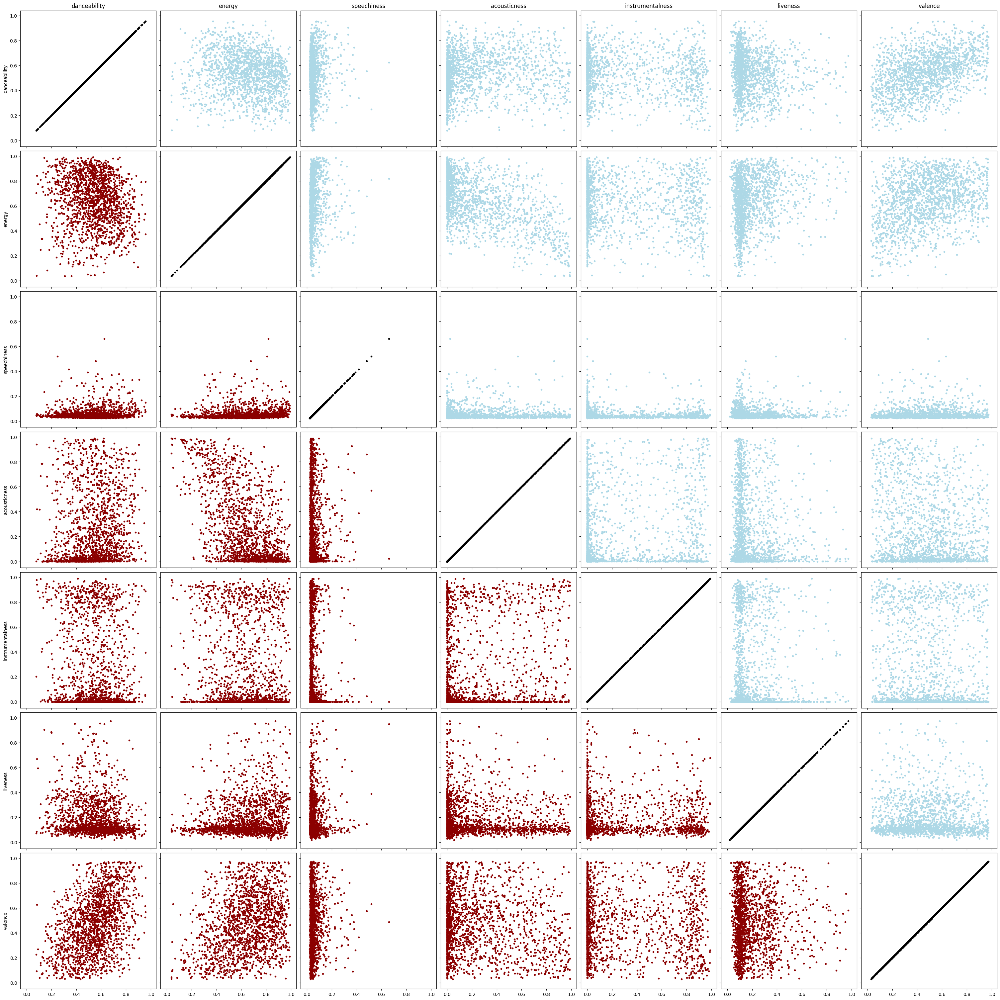

In [9]:
fig = plt.figure(layout='constrained', figsize=(30, 30))
axs = fig.subplots(7, 7, sharex=True, sharey=True)
for i in range(7):
    axs[i,0].set_ylabel(track_df.columns[i])
    for j in range(7):
        xcol, ycol = track_df.columns[j], track_df.columns[i]
        ax = axs[i][j]
        color = 'darkred' if i > j else 'black' if i == j else 'lightblue'
        ax.scatter(track_df[xcol], track_df[ycol], marker='.', c=color)
for j in range(7):
    axs[0,j].set_title(track_df.columns[j])
plt.show()

## Find reasonable number of clusters

Note: removing 'liveness' because I don't want that to be a factor and 'speechiness' because experimentation shows it's not important. Also transforming the range of instrumentalness so it has less effect on the clusters.

In [10]:
testing_df = track_df.drop(['id', 'liveness', 'speechiness'], axis=1)
testing_df.instrumentalness = testing_df.instrumentalness * 0.5
testing_df.head()

,danceability,energy,acousticness,instrumentalness,valence
0,0.230,0.931,0.000214,0.009450,0.428
1,0.173,0.918,0.048100,0.007000,0.194
2,0.264,0.879,0.000069,0.099000,0.255
3,0.345,0.790,0.002410,0.000003,0.444
4,0.252,0.886,0.000029,0.000003,0.498


In [11]:
X = np.array(testing_df)
X.shape

(1736, 5)

For n_clusters = 2 The average silhouette_score is : 0.34385940289083433
For n_clusters = 3 The average silhouette_score is : 0.24981554026055103
For n_clusters = 4 The average silhouette_score is : 0.23502701472105317
For n_clusters = 5 The average silhouette_score is : 0.22136872755045658
For n_clusters = 6 The average silhouette_score is : 0.1982687815992569
For n_clusters = 7 The average silhouette_score is : 0.20886691687394582
For n_clusters = 8 The average silhouette_score is : 0.21719619531637438
For n_clusters = 9 The average silhouette_score is : 0.2066101294281724
For n_clusters = 10 The average silhouette_score is : 0.2037372197676991


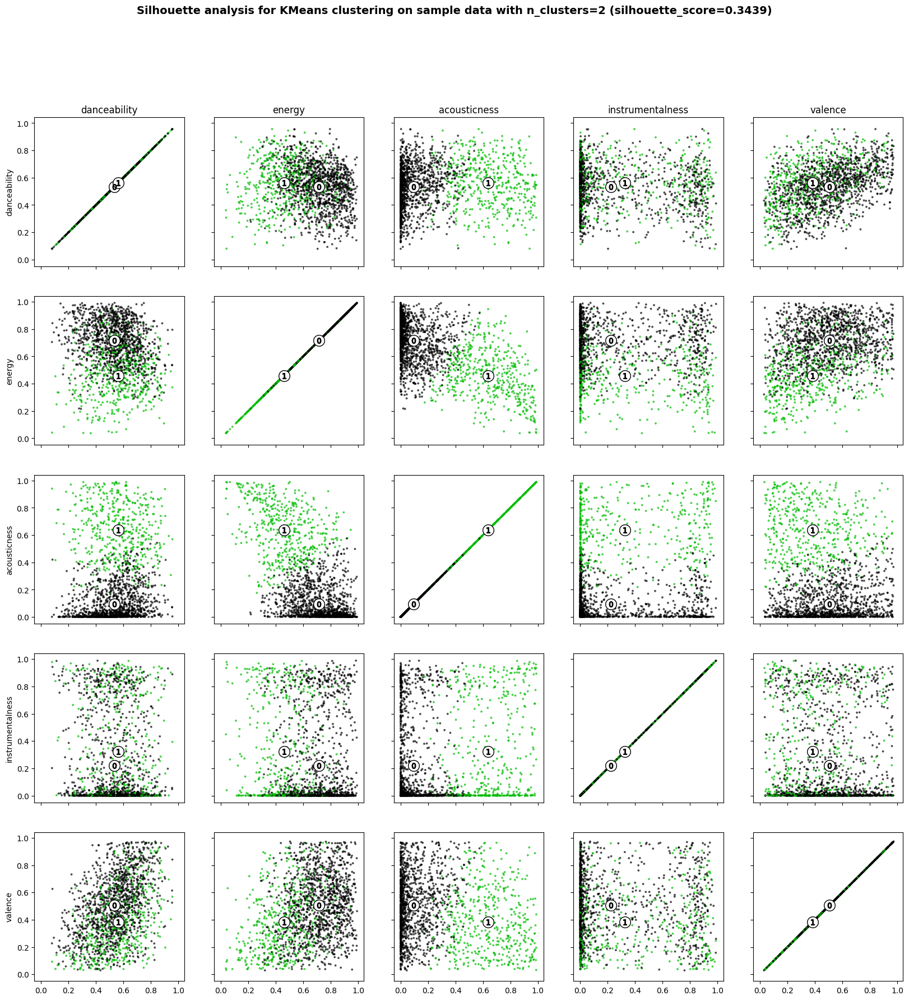

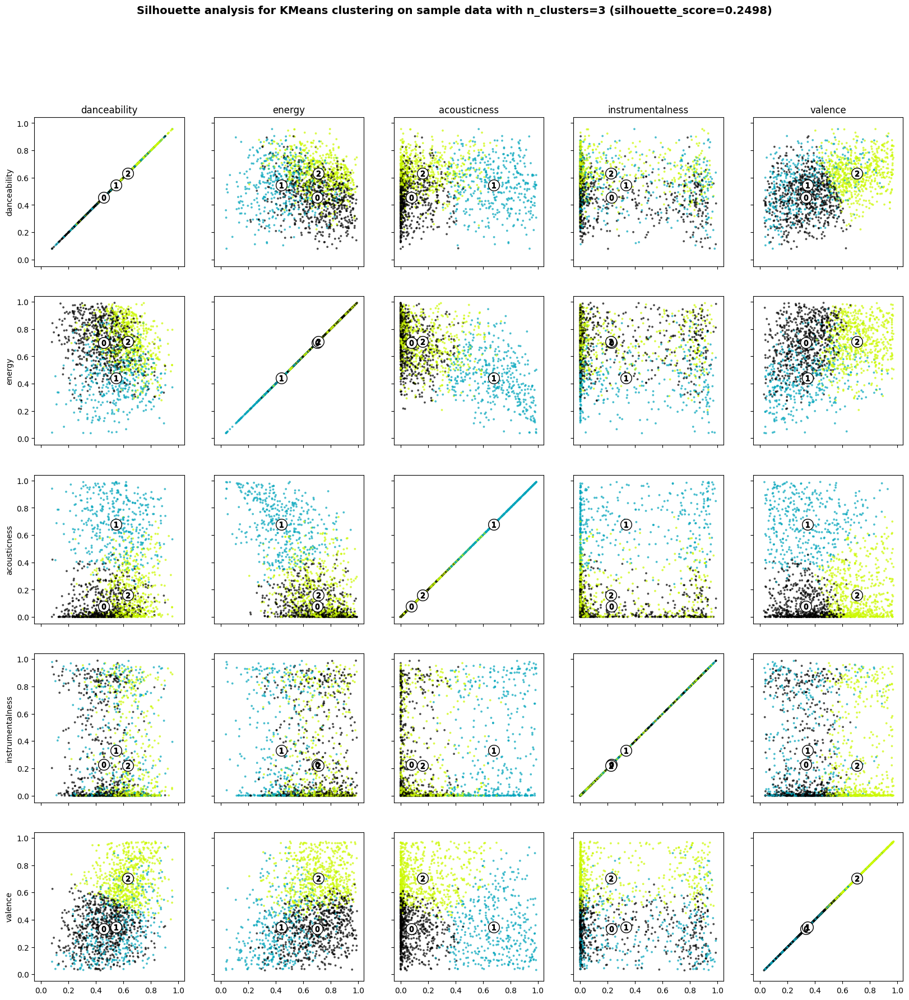

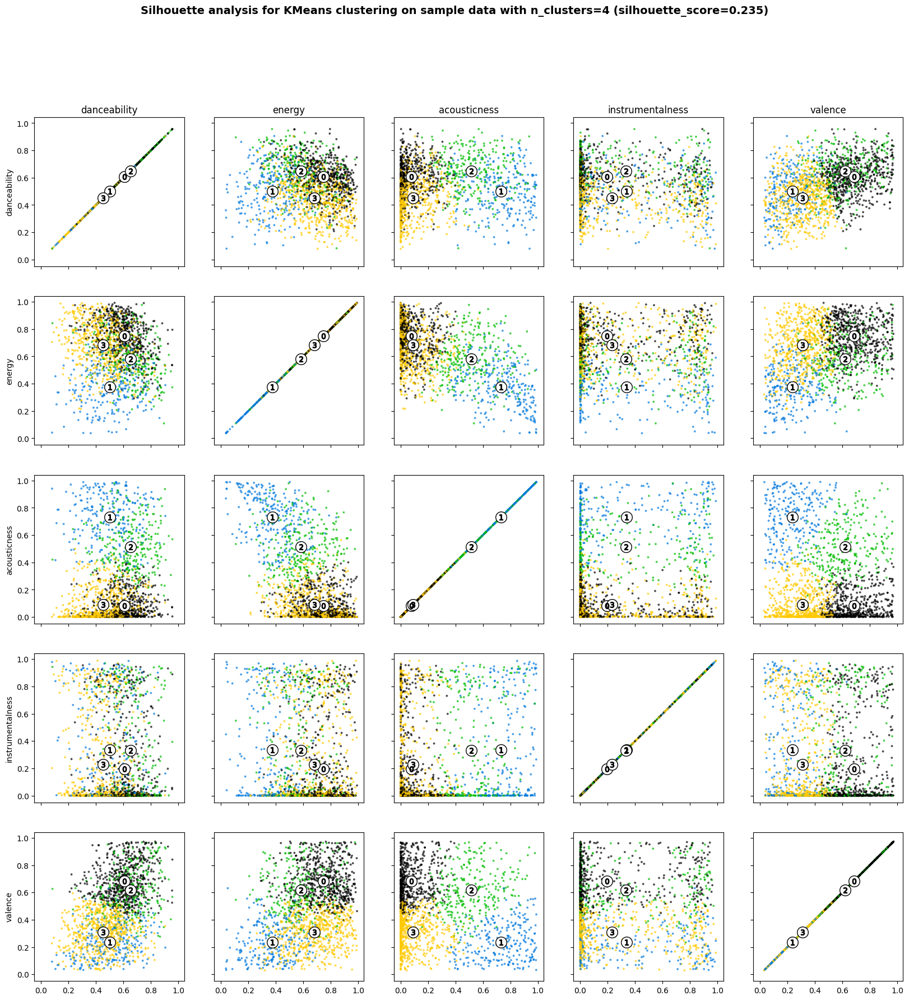

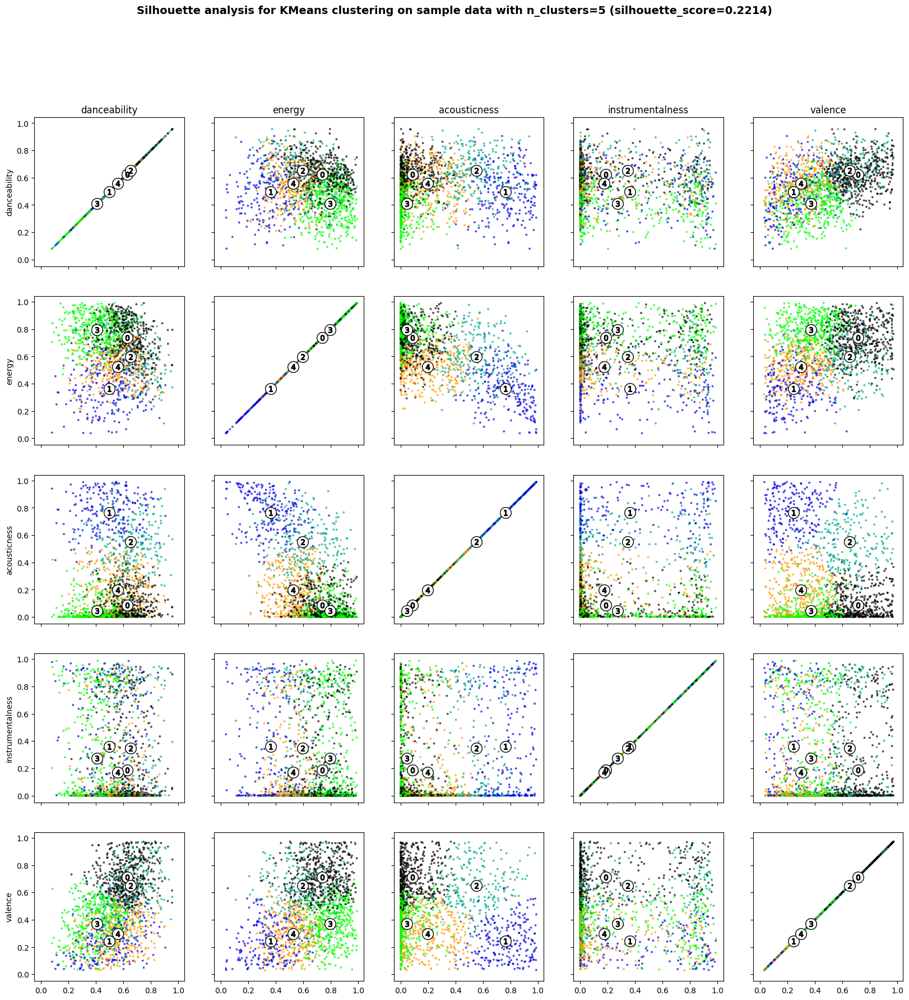

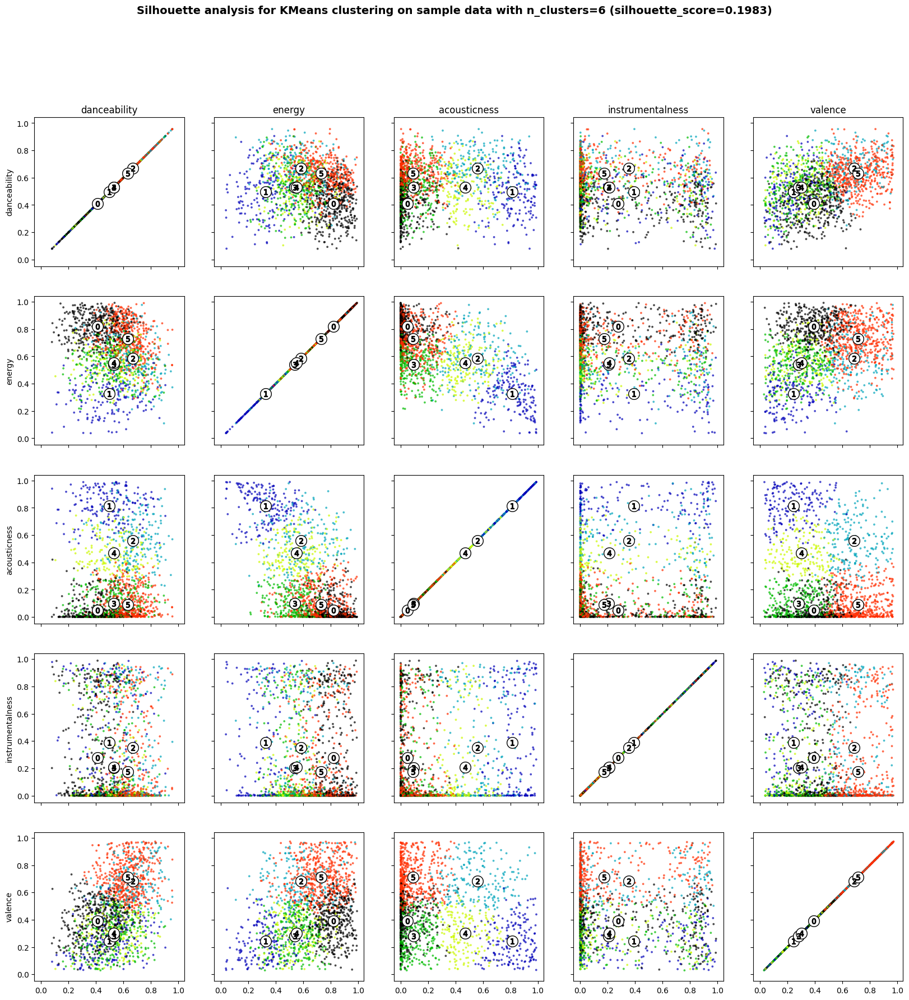

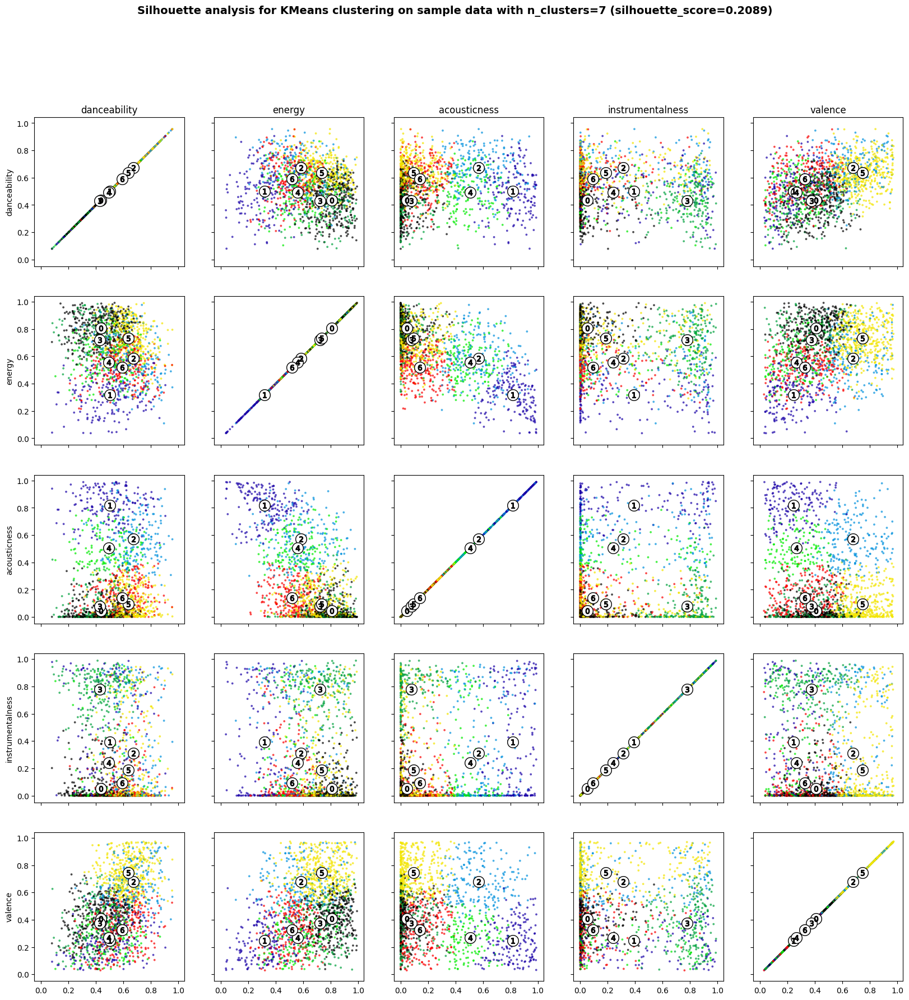

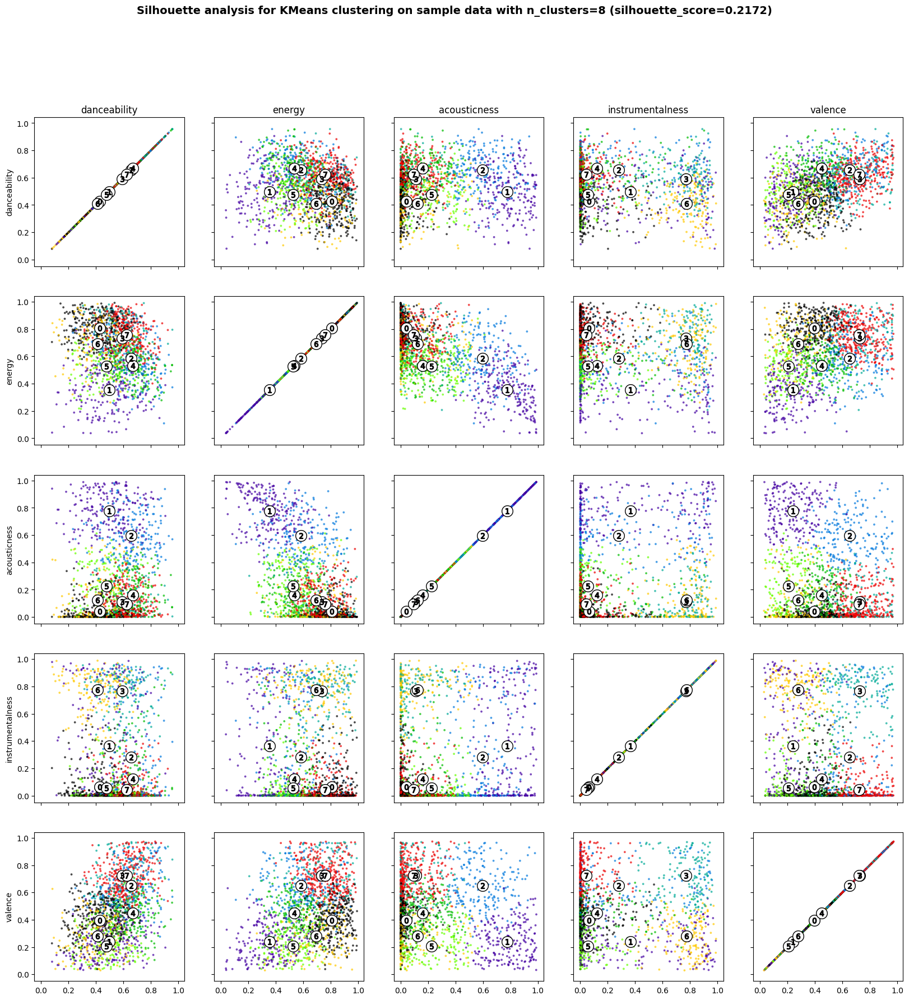

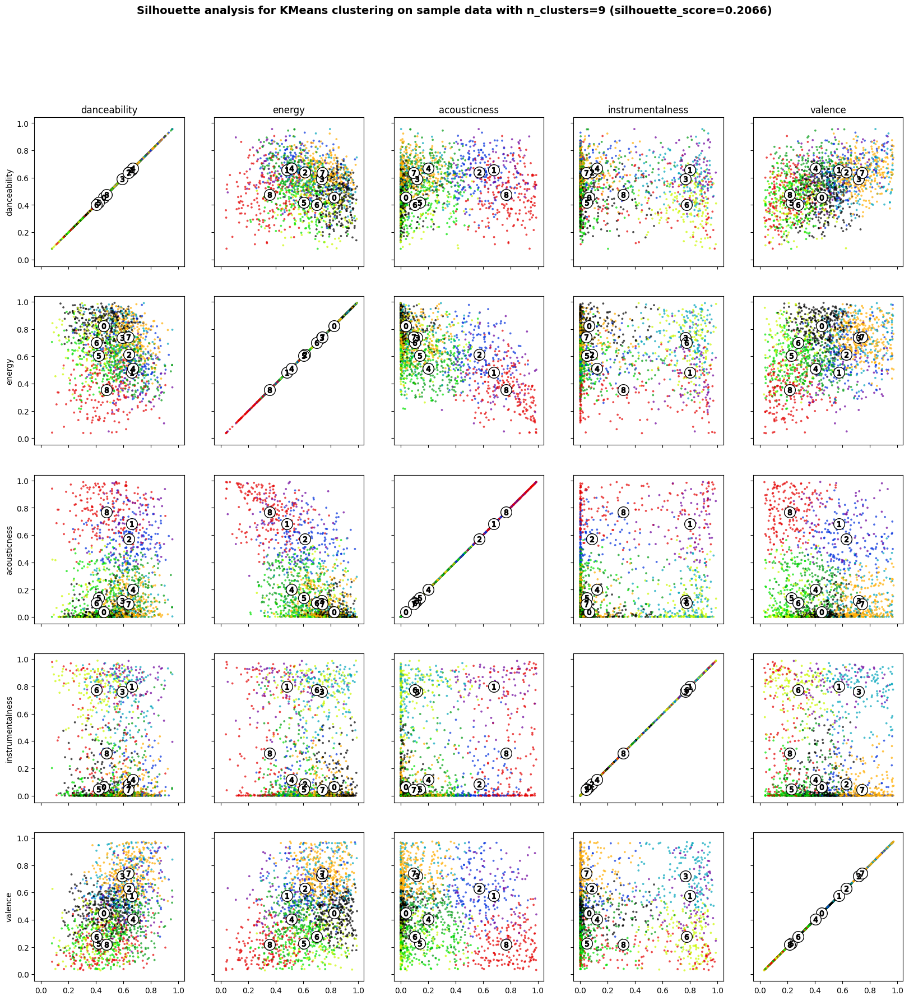

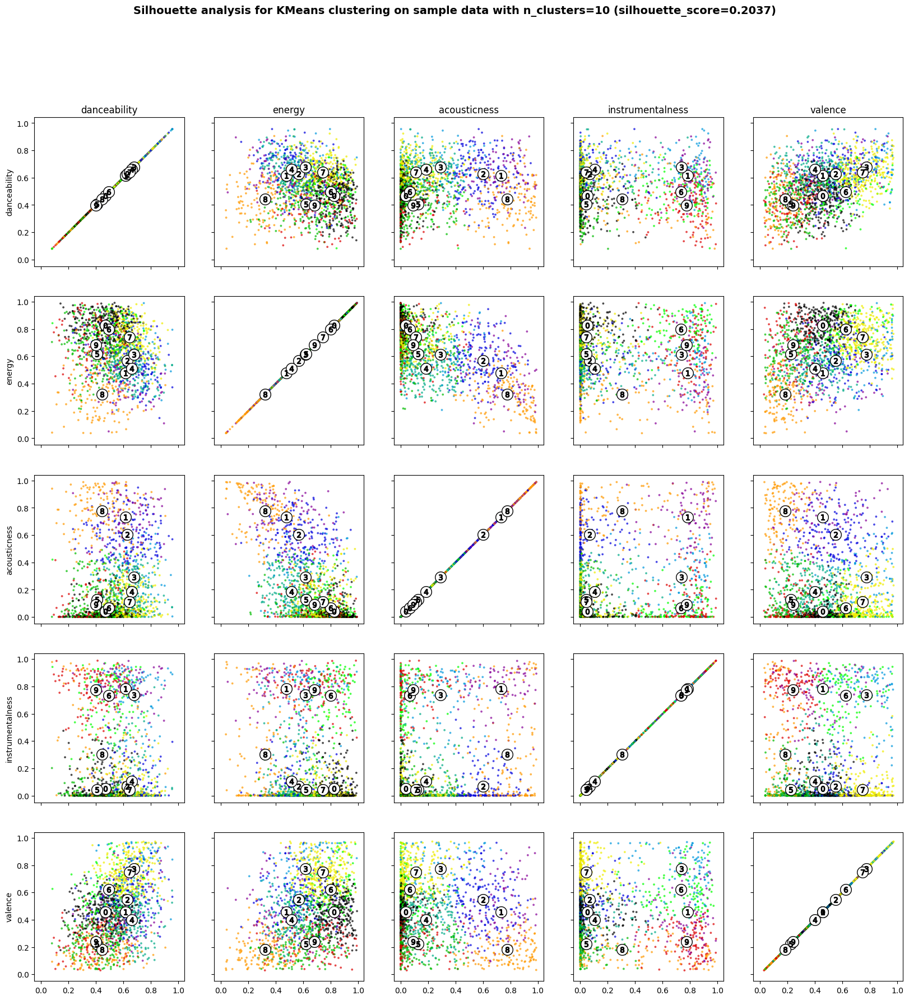

In [12]:
clusters = {}


for n_clusters in range(2, 11):
    fig, axs = plt.subplots(X.shape[1], X.shape[1], sharex=True, sharey=True)
    fig.set_size_inches(20, 20)

    clusterer = KMeans(n_clusters=n_clusters, random_state=7)
    cluster_labels = clusterer.fit_predict(X)
    centers = clusterer.cluster_centers_
    # Undo shift from altering weighting for instrumentalness
    centers[:, 3] *= 2
    clusters[n_clusters] = {'labels': cluster_labels, 'centers': centers}

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    
    for i in range(X.shape[1]):
        axs[i,0].set_ylabel(testing_df.columns[i])
        for j in range(X.shape[1]):
            xcol, ycol = testing_df.columns[j], testing_df.columns[i]
            ax = axs[i][j]
            colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
            xvals = testing_df[xcol]
            yvals = testing_df[ycol]
            # Undo shift from altering weighting for instrumentalness
            if i == 3:
                yvals = testing_df[ycol] * 2
            if j == 3:
                xvals = testing_df[xcol] * 2
            ax.scatter(xvals, yvals, marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")
            ax.scatter(
                centers[:, j],
                centers[:, i],
                marker="o",
                c="white",
                alpha=1,
                s=200,
                edgecolor="k",
            )
        
            for n, c in enumerate(centers):
                ax.scatter(c[j], c[i], marker="$%d$" % n, alpha=1, s=50, edgecolor="k")
    for j in range(X.shape[1]):
        axs[0,j].set_title(testing_df.columns[j])

    plt.suptitle(
        f"Silhouette analysis for KMeans clustering on sample data with {n_clusters=} (silhouette_score={silhouette_avg:0.4})",
        fontsize=14,
        fontweight="bold",
    )

plt.show()

I've chosen 8 clusters because I like the look of the graphs and it appears to have a better average silhouette score than its neighbors n=7 and n=9.

## Partition track IDs according to clusters 

In [13]:
n_clusters = 8

In [14]:
partitions = clusters[n_clusters]

In [15]:
playlist_track_ids = {}
for cluster_number in range(len(partitions['centers'])):
    playlist_track_ids[cluster_number] = list(track_df[clusters[n_clusters]['labels'] == cluster_number].id)
playlist_track_ids[0][:5]

['3zniSx8DVtUSuJ0WAToZUy',
 '3hGbVLrv1aUWdUg0AXXCZo',
 '432KmEGkAnemVwEWezyFFz',
 '7gRfcuBMi3CUSHOV8qL3wA',
 '5YHhxbtAAkOiIXqNBfYjZU']

## Create new playlists

In [16]:
profile_id = spotify.current_user()['id']
mouths = [']', 'o', 'D', 'O', '*', '|', 'P', '^U']
for cluster_num in range(n_clusters):
    center = clusters[n_clusters]['centers'][cluster_num]
    name = f'alt {cluster_num + 2} :{mouths[cluster_num]}'
    description = (
        'playlist created from alt 1 :) with tracks clustered around ['
        f'danceability={center[0]:0.3}, '
        f'energy={center[1]:0.3}, '
        f'acousticness={center[2]:0.3}, '
        f'instrumentalness={center[3]:0.3}, '
        f'valence={center[4]:0.3}'
        ']')
    new_pl = spotify.user_playlist_create(user=profile_id, name=name, description=description)
    for i in range(0, len(playlist_track_ids[cluster_num]), 100):
        spotify.playlist_add_items(new_pl['id'], playlist_track_ids[cluster_num][i: i+100])